<a href="https://www.kaggle.com/code/engdhay/fbd-part-one?scriptVersionId=273773370" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Part 1
* Collapse of Complexity in Epileptic Seizures _ Theoretical Section 

* This section presents the theoretical foundation of the study
  “Collapse of Complexity in Epileptic Seizures:A Neurotopological Analysis with Entropy, Homology,     and Ricci Curvature.

* It defines the mathematical metrics  Entropy, Fractal Dimension,
  Ricci Curvature, Coherence, and Symmetry  used to describe
  brain energy flow and network topology.

* Purpose: to build the theoretical and mathematical basis
  that supports the practical EEG implementation in the next section.

# 1.1 EEG Visualization and Processing

In [1]:
pip install networkx antropy ripser

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 841.3/841.3 kB 12.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.6/48.6 kB 4.2 MB/s eta 0:00:00
  Created wheel for hopcroftkarp: filename=hopcroftkarp-1.2.5-py2.py3-none-any.whl size=18104 sha256=6175872c2886ceed30acf9225b4b9927def8b7f9d202122c2cf96d1387a721c3
  Stored in directory: /root/.cache/pip/wheels/1f/cc/2d/de23a8b9ae586817b0b44de4a4b1a08f23473e248a644b312f
Successfully built hopcroftkarp
Note: you may need to restart the kernel to use updated packages.


In [2]:
import mne
import warnings
import os
import numpy as np
import matplotlib.pyplot as plt
import ripser
import persim
import imageio
import antropy as ant
import networkx as nx
from mne.preprocessing import ICA
from scipy.stats import wasserstein_distance
from mne.channels.layout import _find_topomap_coords


--- Starting EEG Visualization and Processing ---

--- Processing chb01 ---
Displaying raw EEG for chb01...
Using matplotlib as 2D backend.


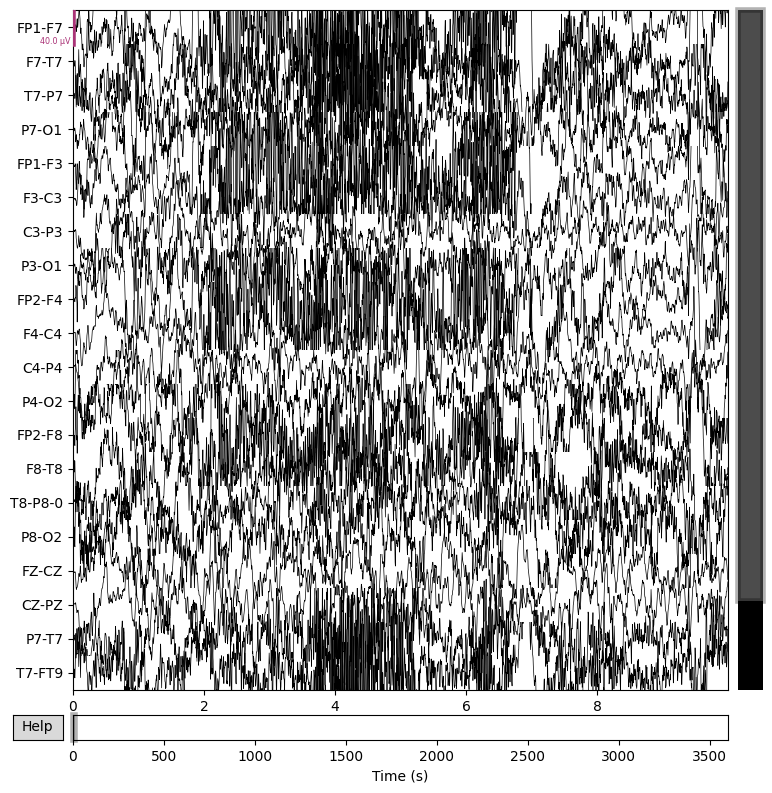

Displaying filtered EEG for chb01...


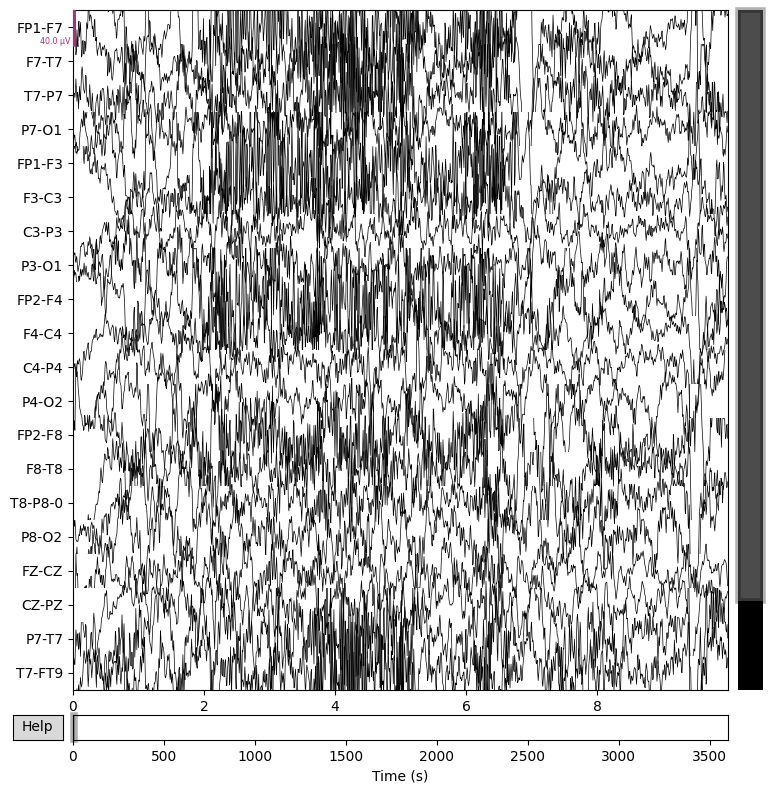


Finished processing all patients.
Writing /kaggle/working/cleaned_eeg/chb01_cleaned_raw.fif
Closing /kaggle/working/cleaned_eeg/chb01_cleaned_raw.fif
[done]
 Saved cleaned EEG for chb01 at: /kaggle/working/cleaned_eeg/chb01_cleaned_raw.fif

--- Processing chb02 ---
Displaying raw EEG for chb02...


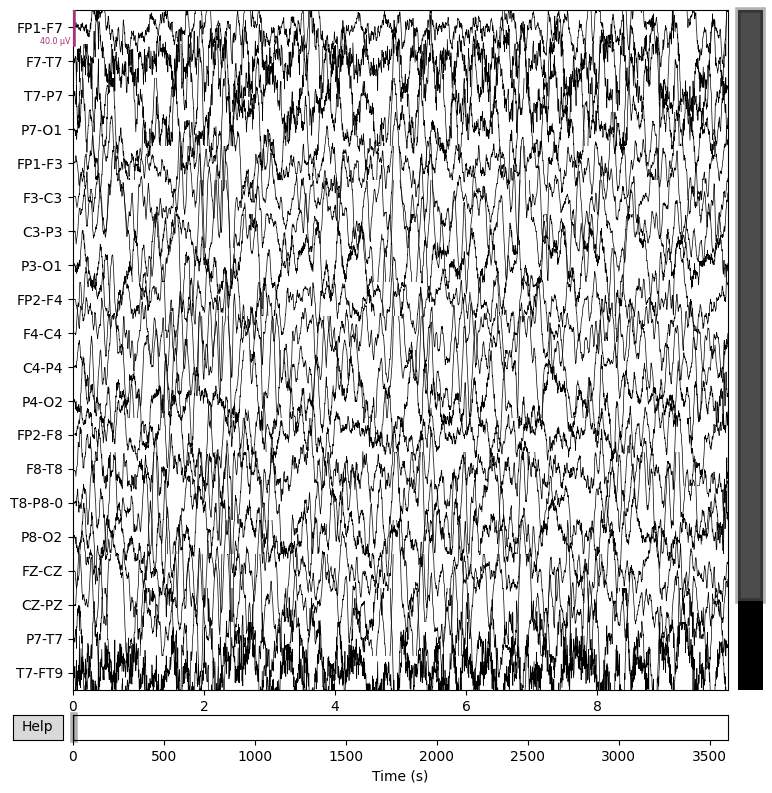

Displaying filtered EEG for chb02...


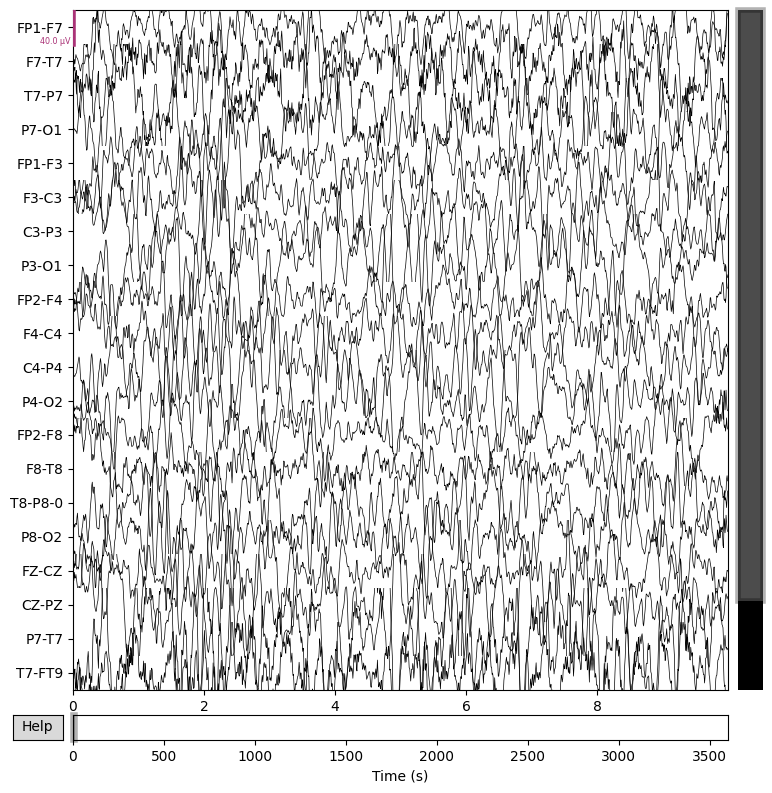


Finished processing all patients.
Writing /kaggle/working/cleaned_eeg/chb02_cleaned_raw.fif
Closing /kaggle/working/cleaned_eeg/chb02_cleaned_raw.fif
[done]
 Saved cleaned EEG for chb02 at: /kaggle/working/cleaned_eeg/chb02_cleaned_raw.fif

--- Processing chb03 ---
Displaying raw EEG for chb03...


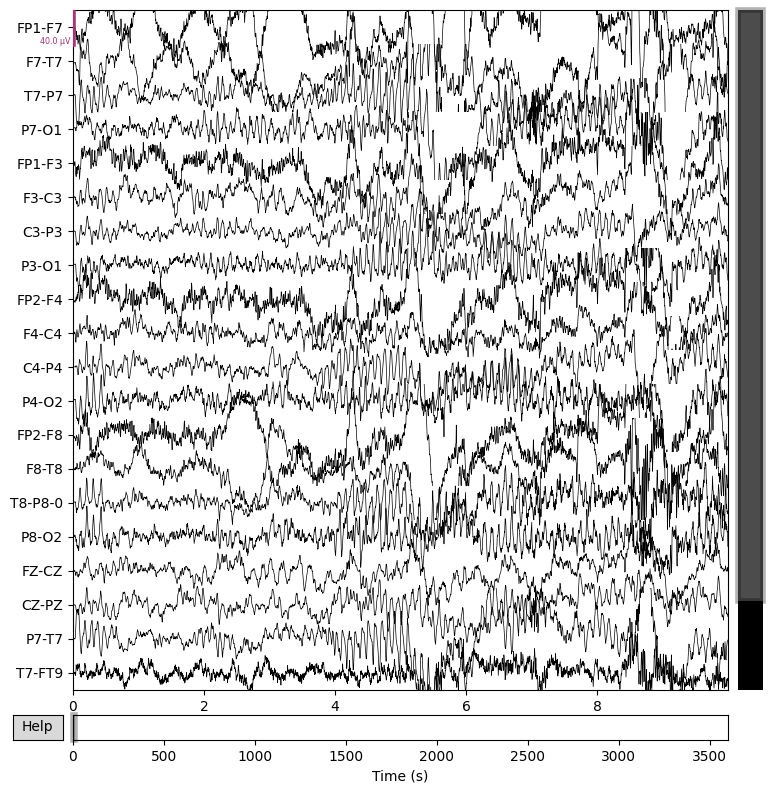

Displaying filtered EEG for chb03...


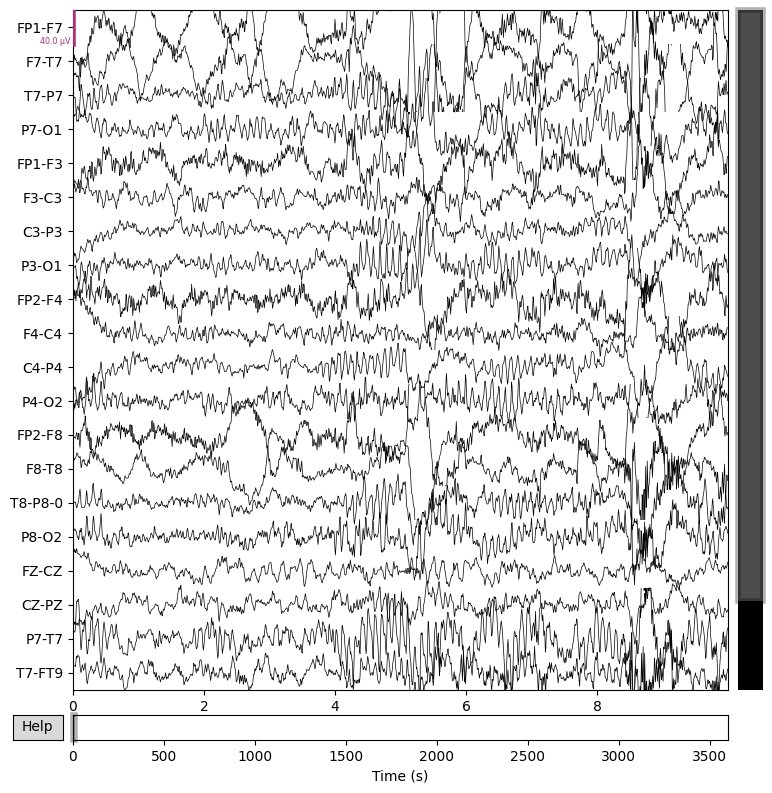


Finished processing all patients.
Writing /kaggle/working/cleaned_eeg/chb03_cleaned_raw.fif
Closing /kaggle/working/cleaned_eeg/chb03_cleaned_raw.fif
[done]
 Saved cleaned EEG for chb03 at: /kaggle/working/cleaned_eeg/chb03_cleaned_raw.fif


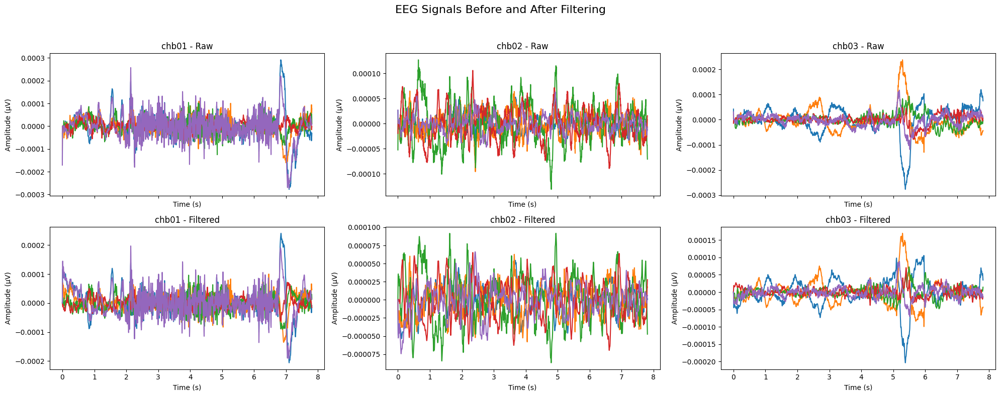

EEG visualization and saving completed successfully.


In [3]:


print("--- Starting EEG Visualization and Processing ---")
warnings.filterwarnings("ignore", message="Channel names are not unique")

# Dataset path and patients
base_path = '/kaggle/input/seizure-epilepcy-chb-mit-eeg-dataset-pediatric/chb-mit-scalp-eeg-database-1.0.0'
patients = [f"chb{str(i).zfill(2)}" for i in range(1, 4)]  # chb01 - chb03

# Create output folder for cleaned data
output_dir = '/kaggle/working/cleaned_eeg'
os.makedirs(output_dir, exist_ok=True)

# Dictionaries to store raw and filtered data
raw_dict = {}
filtered_dict = {}

for patient in patients:
    print(f"\n--- Processing {patient} ---")
    
    # Load EEG recording
    filename = os.path.join(base_path, patient, f"{patient}_01.edf")
    raw = mne.io.read_raw_edf(filename, preload=True, verbose=False)
    
    # Handle duplicate channel names
    unique_names = []
    rename_dict = {}
    for i, ch in enumerate(raw.info['ch_names']):
        if ch in unique_names:
            new_name = f"{ch}_{i}"
            rename_dict[ch] = new_name
            unique_names.append(new_name)
        else:
            unique_names.append(ch)
    if rename_dict:
        raw.rename_channels(rename_dict)
    
    raw_dict[patient] = raw  # Store raw EEG
    # Display raw EEG
    print(f"Displaying raw EEG for {patient}...")
    raw.plot(duration=10, n_channels=20, title=f"Raw EEG - {patient}")
    
    # --- Filtering ---
    raw_filtered = raw.copy()
    raw_filtered.filter(l_freq=0.5, h_freq=None, verbose=False)    # Remove DC
    raw_filtered.notch_filter(freqs=50, verbose=False)              # Notch 50Hz
    raw_filtered.filter(l_freq=1.0, h_freq=40.0, verbose=False)    # Band-pass 1-40Hz
    raw_filtered.set_eeg_reference('average', verbose=False)       # Re-reference
    
    filtered_dict[patient] = raw_filtered  # Store filtered EEG
    # Display filtered EEG
    print(f"Displaying filtered EEG for {patient}...")
    raw_filtered.plot(duration=10, n_channels=20, title=f"Filtered EEG - {patient}")
    print("\nFinished processing all patients.")
    
    # Fix meas_date issue
    raw_filtered.set_meas_date(None)

    # Save cleaned EEG
    save_path = os.path.join(output_dir, f"{patient}_cleaned_raw.fif")
    raw_filtered.save(save_path, overwrite=True)
    print(f" Saved cleaned EEG for {patient} at: {save_path}")

# ------------------ Plot multiple patients together ------------------
fig, axes = plt.subplots(2, len(patients), figsize=(20, 8), sharex=True)
fig.suptitle("EEG Signals Before and After Filtering", fontsize=16)
axes = axes.flatten()

for i, patient in enumerate(patients):
    # --- RAW EEG (first 5 channels, first 2000 samples) ---
    raw_data = raw_dict[patient].get_data(picks=range(5))[:, :2000]
    times = raw_dict[patient].times[:2000]
    axes[i].plot(times, raw_data.T)
    axes[i].set_title(f"{patient} - Raw")
    axes[i].set_xlabel("Time (s)")
    axes[i].set_ylabel("Amplitude (µV)")
    
    # --- FILTERED EEG ---
    filt_data = filtered_dict[patient].get_data(picks=range(5))[:, :2000]
    axes[i + len(patients)].plot(times, filt_data.T)
    axes[i + len(patients)].set_title(f"{patient} - Filtered")
    axes[i + len(patients)].set_xlabel("Time (s)")
    axes[i + len(patients)].set_ylabel("Amplitude (µV)")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

print("EEG visualization and saving completed successfully.")


# 1.2 EEG Cleaning Quality without ICA

| Step              | Operation                          | Mathematical Equation                                                    |
|------------------|------------------------------------|--------------------------------------------------------------------------|
| Reading EEG signal| Voltage difference between electrodes | \( V(t) = V_\text{active}(t) - V_\text{reference}(t) \)                  |
| Segmenting signal | Epoching into time windows         | \( x_i(t) = x(t + iT) \)                                                |
| Averaging epochs  | Evoked response (noise reduction)  | \( \bar{x}(t) = \frac{1}{N}\sum_{i=1}^{N} x_i(t) \)                     |
| Spectral analysis | Power Spectral Density (PSD)       | \( PSD(f) = \frac{1}{T} |X(f)|^2 \)                                     |
| Frequency transform| Fourier Transform                 | \( X(f) = \int_0^T x(t) e^{-j2\pi ft} dt \)                             |
| Filtering noise   | Band-pass filtering (convolution)  | \( y(t) = x(t) * h(t) \)                                                |

--- Starting EEG Cleaning Quality Analysis Without ICA ---

--- Analyzing chb01 ---
Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 513 original time points ...
0 bad epochs dropped
Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 513 original time points ...
0 bad epochs dropped
combining channels using "mean"
combining channels using "mean"


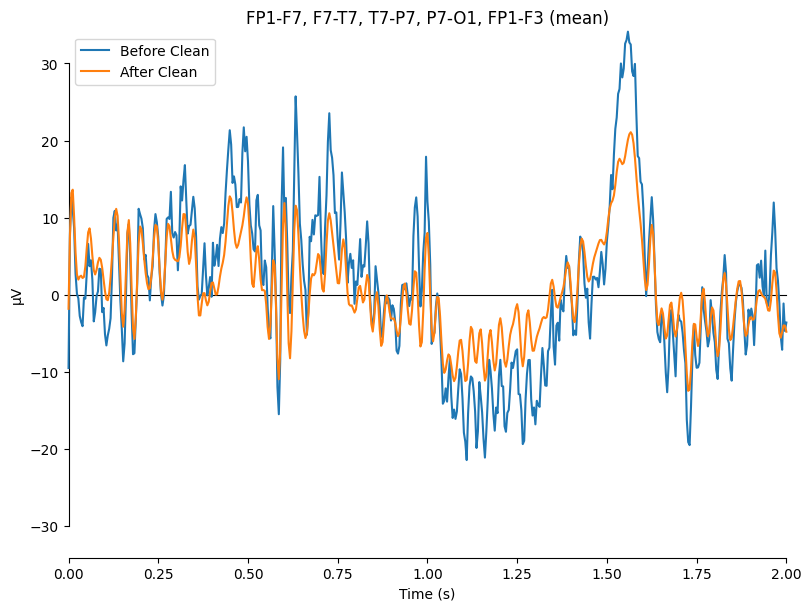

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Effective window size : 16.000 (s)
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Effective window size : 16.000 (s)


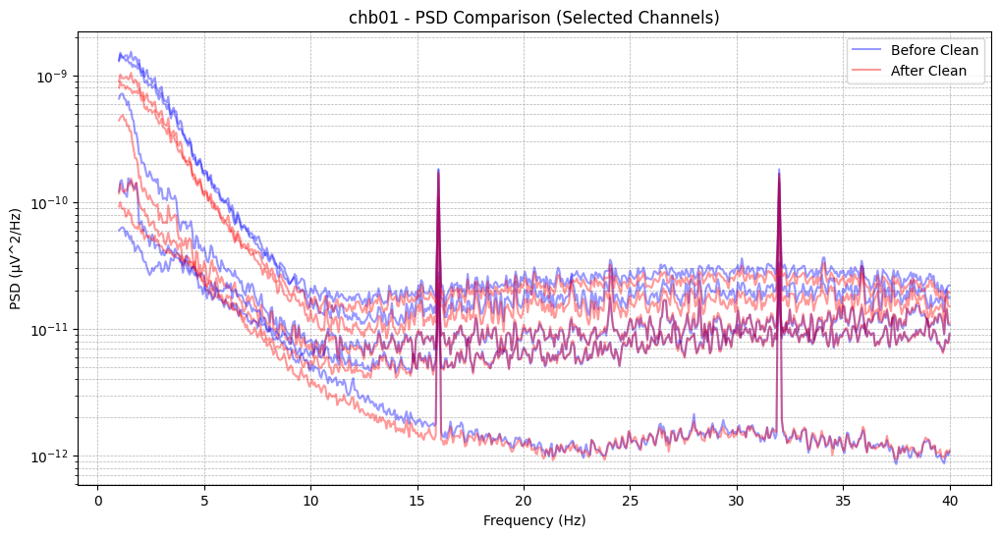


--- Analyzing chb02 ---
Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 513 original time points ...
0 bad epochs dropped
Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 513 original time points ...
0 bad epochs dropped
combining channels using "mean"
combining channels using "mean"


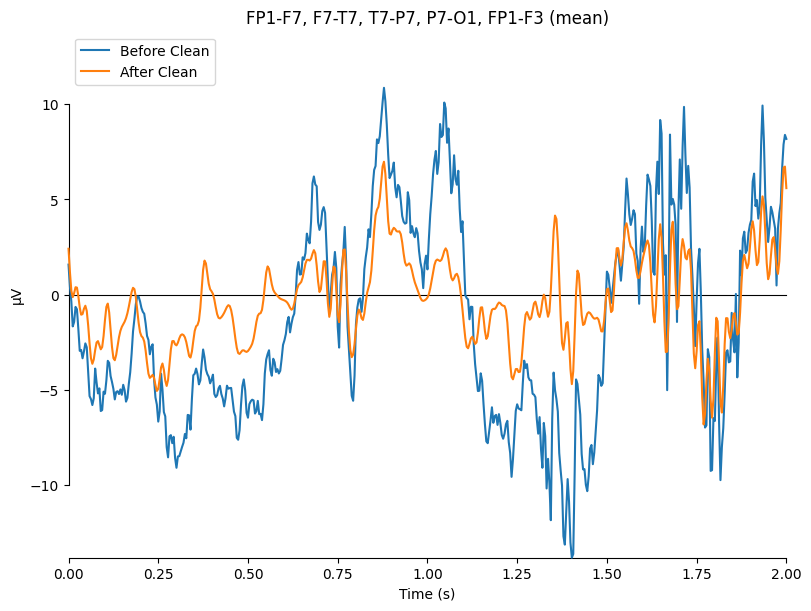

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Effective window size : 16.000 (s)
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Effective window size : 16.000 (s)


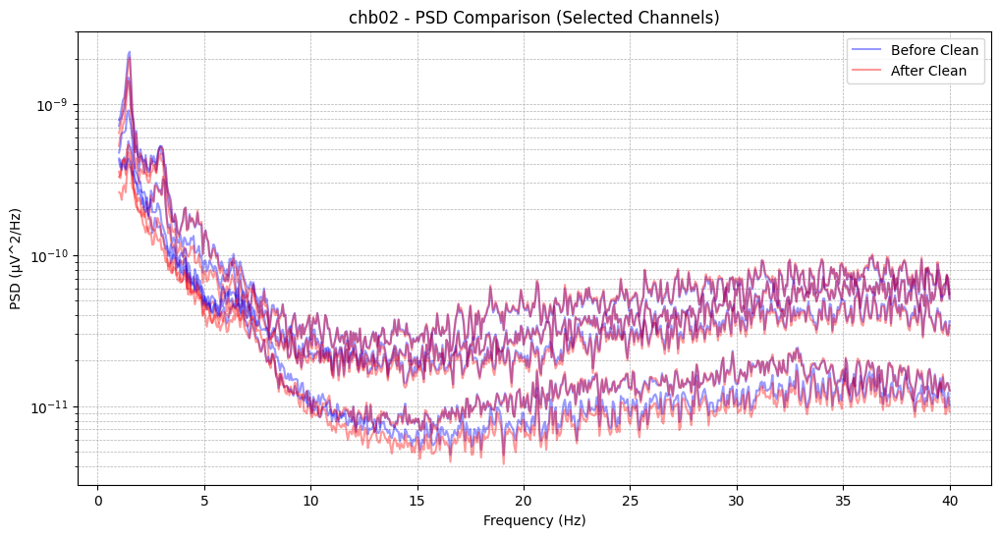


--- Analyzing chb03 ---
Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 513 original time points ...
0 bad epochs dropped
Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 513 original time points ...
0 bad epochs dropped
combining channels using "mean"
combining channels using "mean"


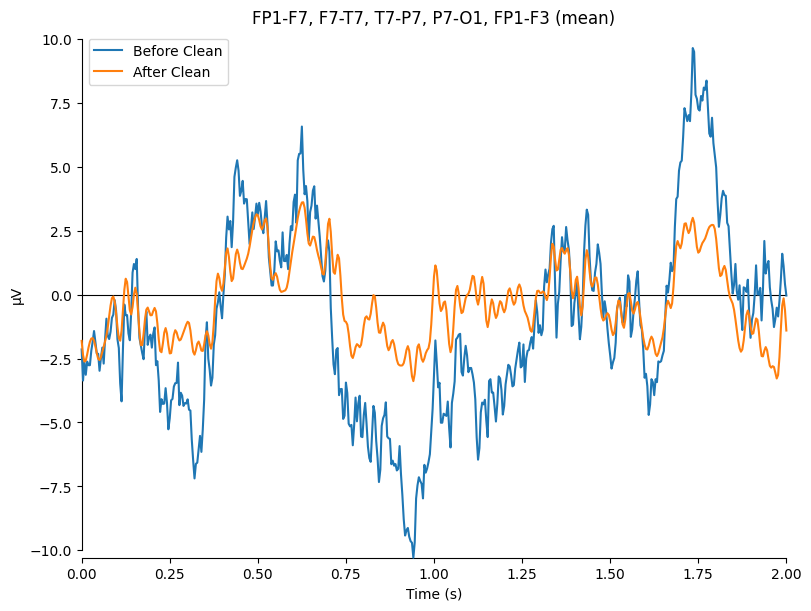

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Effective window size : 16.000 (s)
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Effective window size : 16.000 (s)


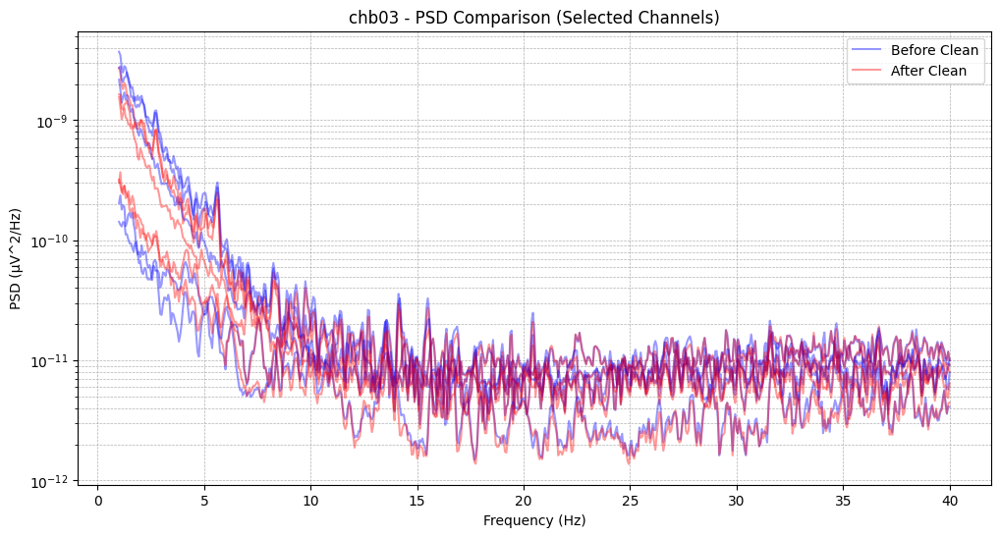


 EEG cleaning quality analysis completed for all patients.


In [4]:


print("--- Starting EEG Cleaning Quality Analysis Without ICA ---")
# List of patients
patients = ['chb01', 'chb02', 'chb03']

# Paths to raw and cleaned EEG data
raw_base_path = '/kaggle/input/seizure-epilepcy-chb-mit-eeg-dataset-pediatric/chb-mit-scalp-eeg-database-1.0.0'
cleaned_path = '/kaggle/working/cleaned_eeg'

# Active channels for visualization (can select more if needed)
active_ch = range(5)  

for patient in patients:
    print(f"\n--- Analyzing {patient} ---")
    
    # Load raw EEG
    raw_file = os.path.join(raw_base_path, patient, f"{patient}_01.edf")
    raw = mne.io.read_raw_edf(raw_file, preload=True, verbose=False)
    
    # Load cleaned EEG
    clean_file = os.path.join(cleaned_path, f"{patient}_cleaned_raw.fif")
    raw_clean = mne.io.read_raw_fif(clean_file, preload=True, verbose=False)
    
   # Create artificial events for epoching (no real triggers in dataset)
    n_events = 10
    events = np.array([[i * int(raw.info['sfreq'] * 3), 0, 1] for i in range(n_events)])
    
    # Epoch the signal around events (0-2 seconds)
    # This allows comparison of average response before and after cleaning

    '''
    x(t): Original signal
    T: Segment length (2 seconds in code)
    i: Segment number (era indicator)
    '''
    epochs_before = mne.Epochs(raw, events, event_id={'stim': 1},
                               tmin=0, tmax=2, baseline=None, preload=True)
    epochs_after = mne.Epochs(raw_clean, events, event_id={'stim': 1},
                              tmin=0, tmax=2, baseline=None, preload=True)
    
   
    # Compute Evoked (average of epochs)
    # Evoked waveforms are useful for checking if artifacts have been removed
    evoked_before = epochs_before.average()
    evoked_after = epochs_after.average()
    
    # Plot Evoked before vs after cleaning
    # Interpretation:
    #   - Smoother waveform after cleaning → artifacts reduced
    #   - Large spikes in "Before Clean" → likely eye blinks, muscle noise
    mne.viz.plot_compare_evokeds(
        {
            'Before Clean': evoked_before,
            'After Clean': evoked_after
        },
        picks=active_ch,
        combine='mean',
        show=True
    )
    
    # Compute PSD (Power Spectral Density) for selected channels
    # PSD helps visualize frequency content and line noise (50Hz)
    psd_before_obj = raw.copy().pick_channels([raw.ch_names[i] for i in active_ch]).compute_psd(fmin=1, fmax=40, n_fft=4096)
    psd_after_obj  = raw_clean.copy().pick_channels([raw_clean.ch_names[i] for i in active_ch]).compute_psd(fmin=1, fmax=40, n_fft=4096)
    
    psd_before = psd_before_obj.get_data()
    psd_after  = psd_after_obj.get_data()
    freqs = psd_before_obj.freqs
    
     # Plot PSD comparison before and after cleaning
    plt.figure(figsize=(12,6))
    for ch in range(psd_before.shape[0]):
        plt.semilogy(freqs, psd_before[ch], color='blue', alpha=0.4)
        plt.semilogy(freqs, psd_after[ch], color='red', alpha=0.4)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('PSD (µV^2/Hz)')
    plt.title(f'{patient} - PSD Comparison (Selected Channels)')
    plt.legend(['Before Clean', 'After Clean'])
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.show()

print("\n EEG cleaning quality analysis completed for all patients.")


> ------------------------------------------------------------------------

# 2 EEG Electrode Locations¶
> arrow_upwardarrow_downwarddelete
This code shows approximate EEG electrode positions for multiple CHB-MIT patients using a standard 10-20 montage. The data is dummy (zeros), so layouts are identical and no real EEG activity is shown. This is purely illustrative for educational or demonstration purposes.

=== Approximate EEG Electrode Locations for CHB-MIT Patients ===

--- chb01 ---
Creating RawArray with float64 data, n_channels=19, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


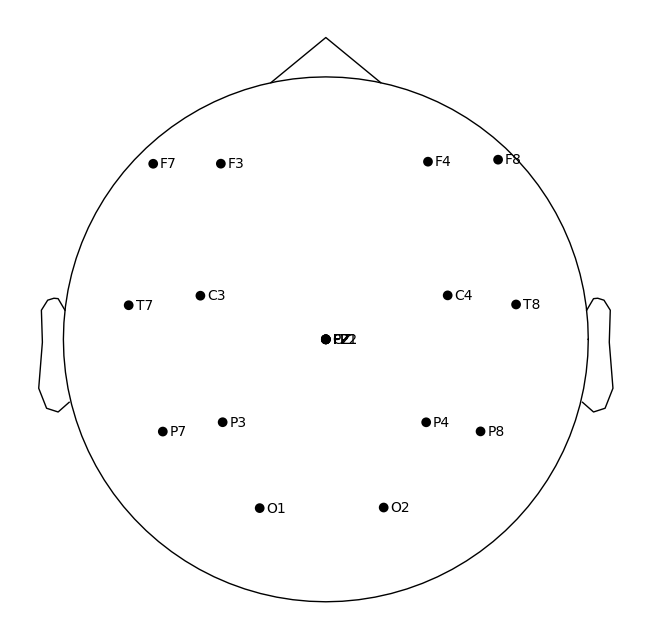


--- chb02 ---
Creating RawArray with float64 data, n_channels=19, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


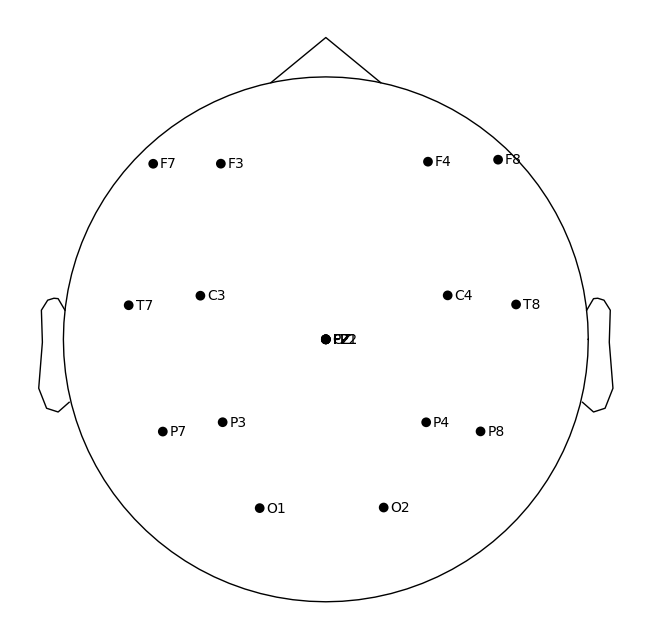


--- chb03 ---
Creating RawArray with float64 data, n_channels=19, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


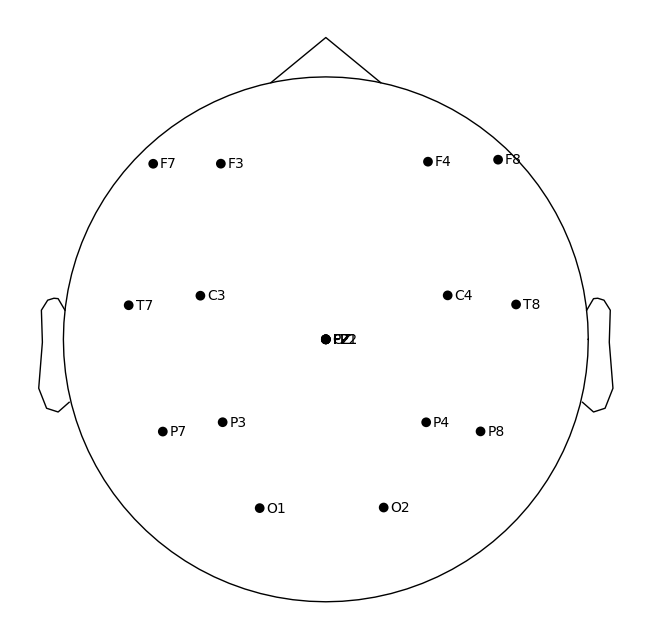

In [5]:


print("=== Approximate EEG Electrode Locations for CHB-MIT Patients ===")
patients = [f"chb{str(i).zfill(2)}" for i in range(1, 4)]

# Standard EEG channels for visualization only
standard_chs = ['FP1','FP2','F7','F3','FZ','F4','F8','T7','C3','CZ','C4','T8','P7','P3','PZ','P4','P8','O1','O2']

for patient in patients:
    print(f"\n--- {patient} ---")
    
    # Load the first EEG recording for each patient
    filename = f"/kaggle/input/seizure-epilepcy-chb-mit-eeg-dataset-pediatric/chb-mit-scalp-eeg-database-1.0.0/{patient}/{patient}_01.edf"
    raw = mne.io.read_raw_edf(filename, preload=True, verbose=False)
    
    # Create a temporary RawArray with zeros, using only standard channels
    # This is done because we only want to show electrode locations, not EEG signals
    info = mne.create_info(ch_names=standard_chs, sfreq=raw.info['sfreq'], ch_types='eeg')
    temp_raw = mne.io.RawArray(data=np.zeros((len(standard_chs), 1)), info=info)
    
    # Apply standard 10-20 montage
    # 'on_missing="ignore"' prevents errors if some channels in standard_chs
    # do not exist in the montage
    montage = mne.channels.make_standard_montage('standard_1020')
    temp_raw.set_montage(montage, on_missing='ignore') 
    # Display the electrode locations on the head
    temp_raw.plot_sensors(show_names=True, title=f"Electrode Locations - {patient}")

* EEG Activity
* This code generates visual EEG heatmaps for a single patient across three seizure-related stages: Before Seizure, During Seizure, and After Seizure.

Important: The values used to generate the heatmaps are fixed and simulated, not derived from actual EEG recordings.

The code is intended purely for visual demonstration purposes, such as showing the concept of topographical brain maps and illustrating how color scales might represent changes in EEG activity.

It is not suitable for medical diagnosis or clinical interpretation, because it does not reflect real neural activity or seizure dynamics.

Creating RawArray with float64 data, n_channels=14, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


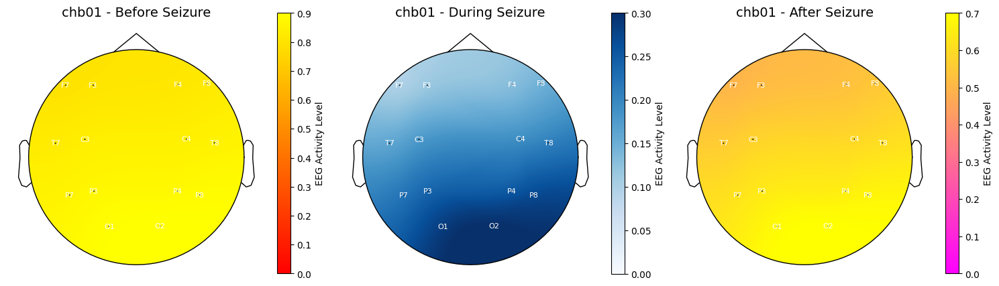

In [6]:


# ====== Patient and channel setup ======
patient = "chb01"
standard_chs = ['F7','F3','F4','F8','T7','C3','C4','T8','P7','P3','P4','P8','O1','O2']

# EEG file path
filename = f"/kaggle/input/seizure-epilepcy-chb-mit-eeg-dataset-pediatric/chb-mit-scalp-eeg-database-1.0.0/{patient}/{patient}_01.edf"
raw = mne.io.read_raw_edf(filename, preload=True, verbose=False)

# Create a dummy RawArray for plotting only
info = mne.create_info(ch_names=standard_chs, sfreq=raw.info['sfreq'], ch_types='eeg')
temp_raw = mne.io.RawArray(data=np.zeros((len(standard_chs), 1)), info=info)

# Apply standard 10-20 montage
montage = mne.channels.make_standard_montage('standard_1020')
temp_raw.set_montage(montage, on_missing='ignore') 

# ====== Define fixed values for each period ======
heatmap_segments = {
    'Before Seizure': np.linspace(0.8, 0.9, len(standard_chs)),   # Warm colors (red/yellow)
    'During Seizure': np.linspace(0.1, 0.3, len(standard_chs)),   # Cool colors (blue)
    'After Seizure': np.linspace(0.5, 0.7, len(standard_chs))     # Medium warm (green/yellow)
}

segment_cmaps = {
    'Before Seizure': 'autumn',
    'During Seizure': 'Blues',
    'After Seizure': 'spring'
}

# ====== Plot heatmaps in one row ======
fig, axes = plt.subplots(1, 3, figsize=(15,5))  # 1 row, 3 columns

for ax, (segment_name, heat_values) in zip(axes, heatmap_segments.items()):
    cmap = segment_cmaps[segment_name]
    
    # Generate topomap coordinates without overlap issues
    picks = list(range(len(temp_raw.ch_names)))
    pos = _find_topomap_coords(temp_raw.info, picks=picks, ignore_overlap=True)
    
    # Plot the heatmap
    im, cn = mne.viz.plot_topomap(
        heat_values, temp_raw.info, axes=ax, show=False,
        cmap=cmap, contours=0
    )
    
    # Add channel names manually
    for name, (x, y) in zip(standard_chs, pos):
        ax.text(x, y, name, fontsize=8, ha='center', va='center', color='white')
    
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label('EEG Activity Level', fontsize=10)
    
    # Set title
    ax.set_title(f"{patient} - {segment_name}", fontsize=14)

plt.tight_layout()
plt.show()


> ------------------------------------

# 3.1 ICA

* The core idea of ICA is:
> "To find the mathematical transformation between separated components statistically."

* To achieve this, two different mathematical methods can be used,

> but both lead to the same result: separating the liberal factors (such as visual noise, neural factors, etc.).

* Method 1: Maximize Non-Gaussianity (This is the method used in code via FastICA)

> A mixed EEG signal is close to Gaussian (normal) because it is a mixture of many sources. Each independent source (such as eye or muscle activity) is non-Gaussian.

* Kurtosis (Measure of Non-Gaussianity)
>  kurt(y)=E[y4]−3(E[y2])2
* Measures how far a signal deviates from Gaussian.
  > High kurtosis → signal is more independent (non-Gaussian).
* Negentropy (Main Criterion in FastICA)
  > J(y)=H(ygauss)−H(y)
* H : entropy
* H(ygauss): Entropy of a Gaussian signal with same variance
* H(y):Entropy of the current signal
* Larger J(y) → signal is less Gaussian

* FastICA Optimization Function
>  J(W)=∣E{G(Wx)}−E{G(v)}∣

* G(x): non-linear function (e.g.,log(cosh(𝑥))log(cosh(x)) or 𝑥4
* v: Gaussian random variable
* Wx: separated component
> Goal: Find 𝑊 that maximizes 𝐽(𝑊) making each component maximally non-Gaussian.

* Separating the composite EEG signal into a set of independent signals (components).
* The basic equation:
> X = A ⋅ S
Where:
X = signals recorded from electrodes (EEG channels)
S = original signals (independent sources such as the brain, eye, muscles)
A = mixing matrix
* The ICA attempts to reverse this process:
> S = W ⋅ X
where the components S i S i
* are statistically independent (i.e., do not depend on each other). 

| Label         | Meaning                               | Typical Source / Interpretation                                           |
|---------------|---------------------------------------|---------------------------------------------------------------------------|
| ICA000        | Independent Component #0 (the first extracted source) | Often represents eye blink artifact (slow, large wave at frontal sites) |
| ICA001        | Independent Component #1 (the second source) | Often eye movement (horizontal or vertical) or muscle noise             |
| ICA002        | Independent Component #2 | Can represent brain alpha activity or temporal lobe rhythm               |
| ICA003        | Independent Component #3 | Might be muscle tension or small motion artifact                         |
| ICA004        | Independent Component #4 | Could be part of true cortical EEG activity (useful brain signal)        |
| ICA005 – ICA015 | Later components                     | Usually contain weak or mixed signals, sometimes background EEG or line noise |



=== Processing chb01 ===
Opening raw data file /kaggle/working/cleaned_eeg/chb01_cleaned_raw.fif...
Isotrak not found
    Range : 0 ... 921599 =      0.000 ...  3599.996 secs
Ready.
Reading 0 ... 921599  =      0.000 ...  3599.996 secs...
Fitting ICA to data using 23 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 11.1s.
Creating RawArray with float64 data, n_channels=20, n_times=921600
    Range : 0 ... 921599 =      0.000 ...  3599.996 secs
Ready.


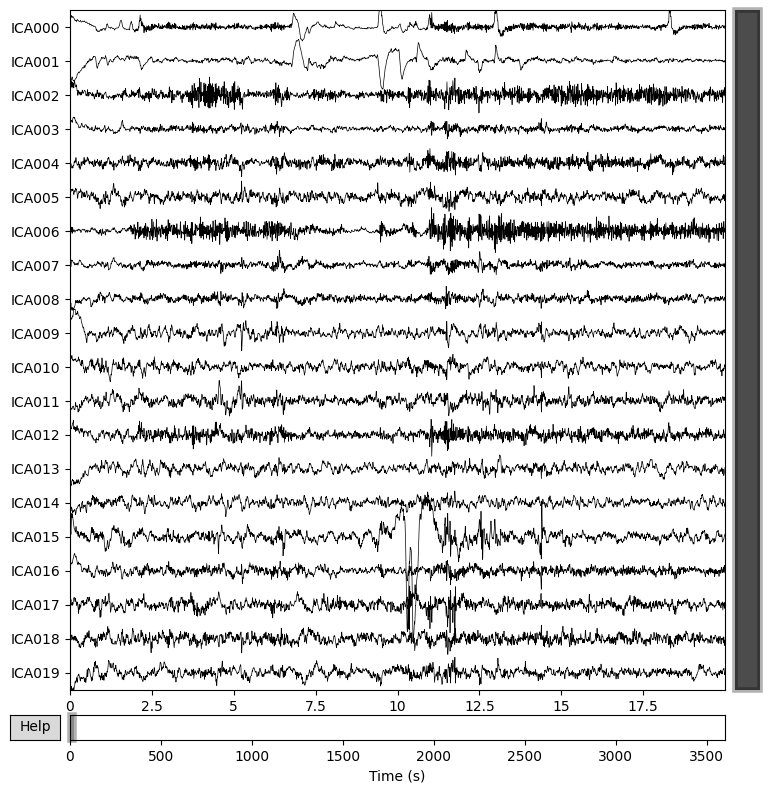

Components excluded for chb01: [0, 1]
Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 2 ICA components
    Projecting back using 23 PCA components


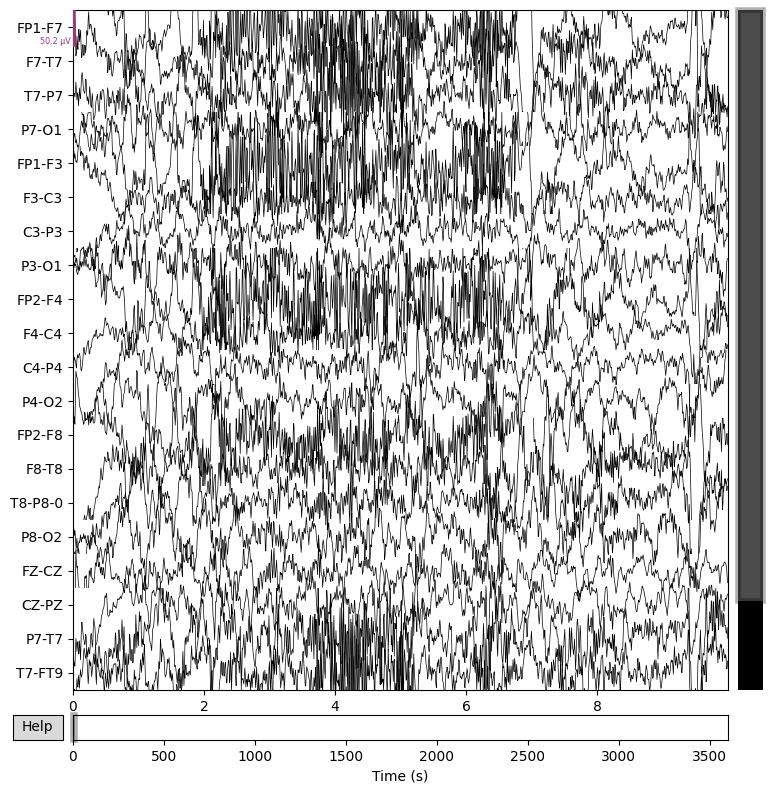

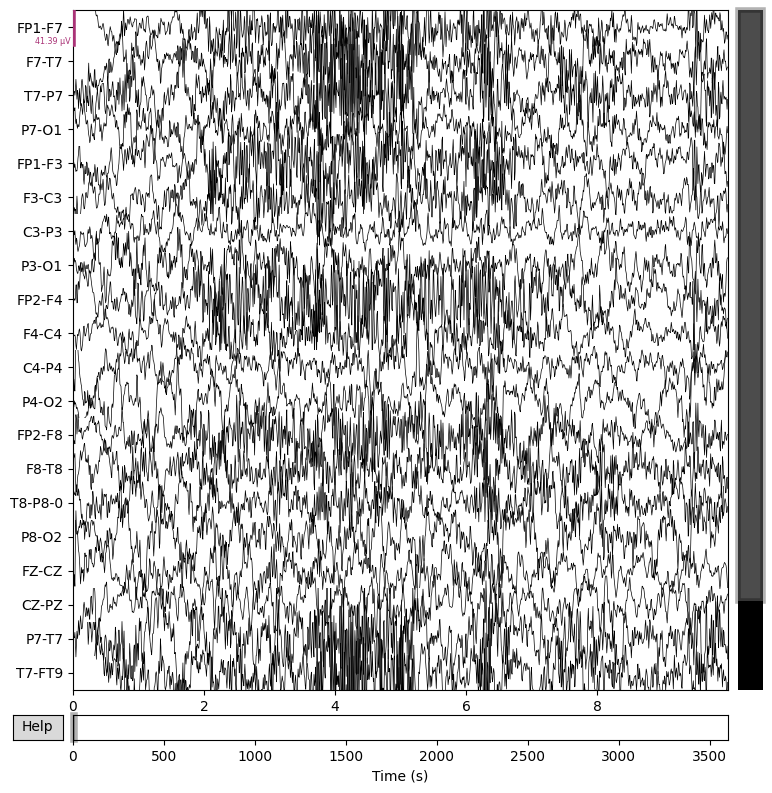

Writing /kaggle/working/clean_eeg_ica/chb01_cleaned_raw.fif
Closing /kaggle/working/clean_eeg_ica/chb01_cleaned_raw.fif
[done]
Cleaned EEG saved for chb01: /kaggle/working/clean_eeg_ica/chb01_cleaned_raw.fif

=== Processing chb02 ===
Opening raw data file /kaggle/working/cleaned_eeg/chb02_cleaned_raw.fif...
Isotrak not found
    Range : 0 ... 921599 =      0.000 ...  3599.996 secs
Ready.
Reading 0 ... 921599  =      0.000 ...  3599.996 secs...
Fitting ICA to data using 23 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 10.3s.
Creating RawArray with float64 data, n_channels=20, n_times=921600
    Range : 0 ... 921599 =      0.000 ...  3599.996 secs
Ready.


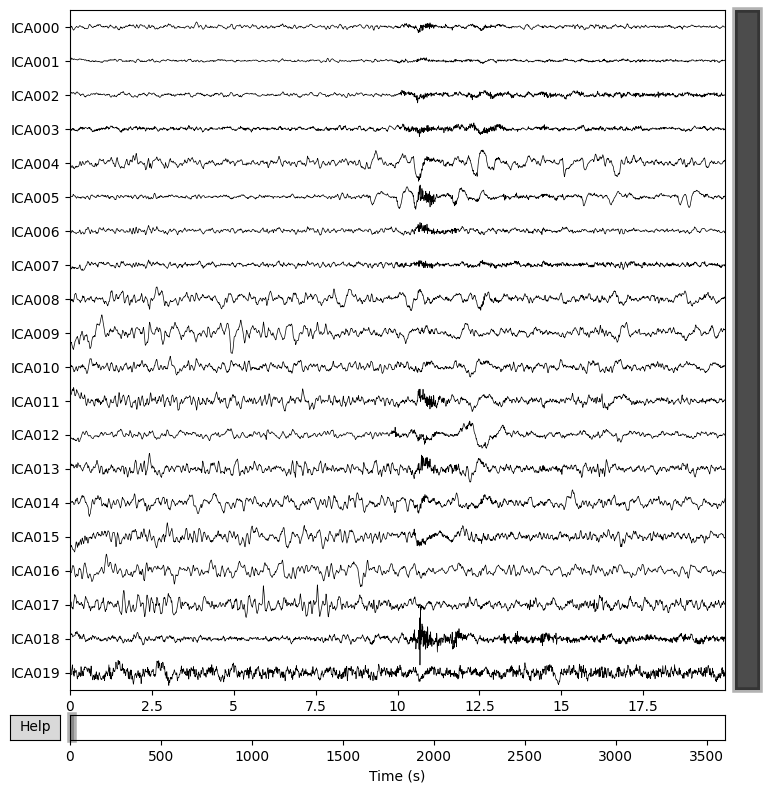

Components excluded for chb02: [0, 1]
Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 2 ICA components
    Projecting back using 23 PCA components


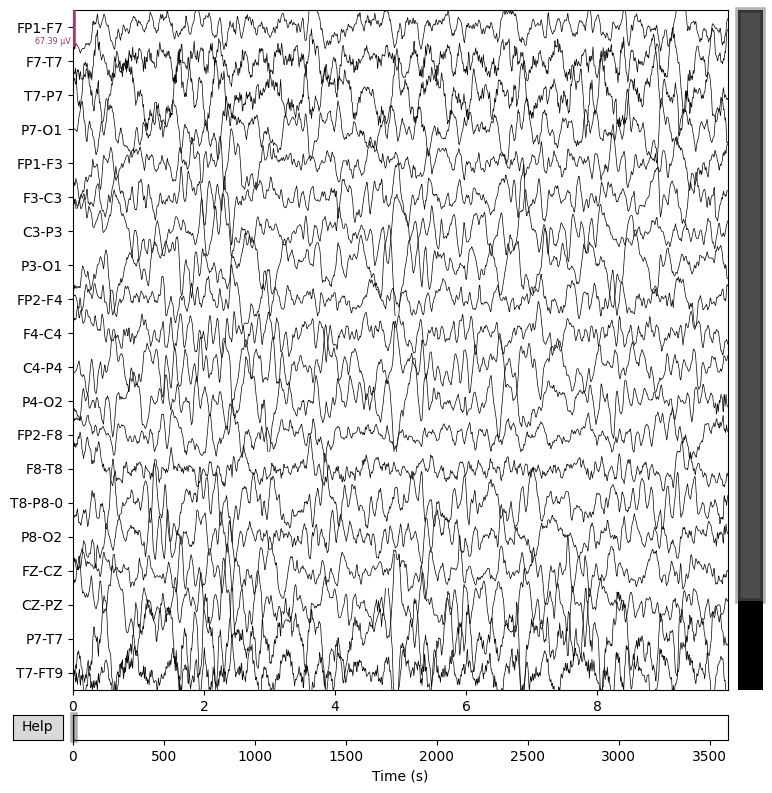

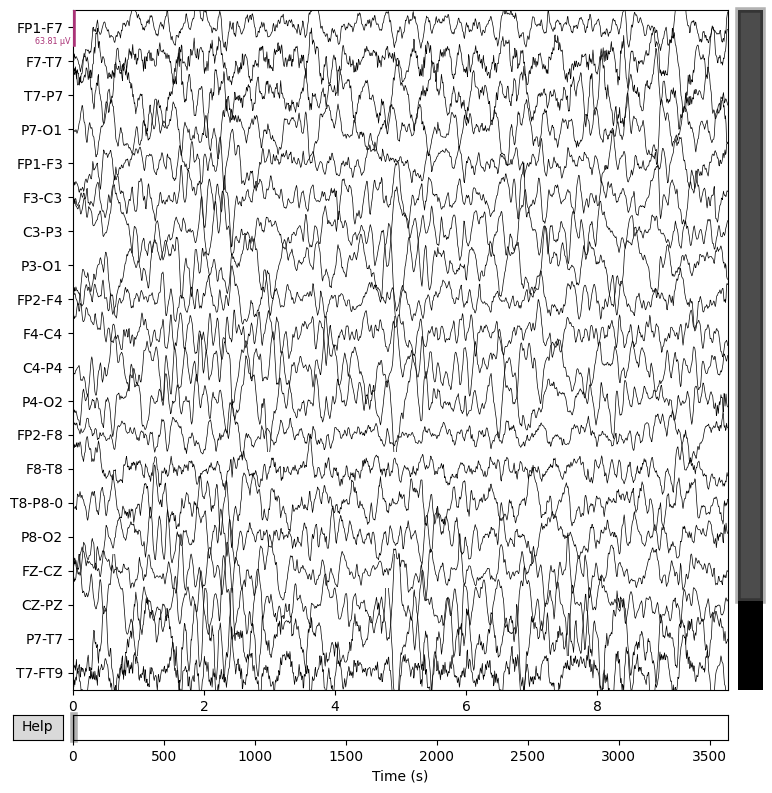

Writing /kaggle/working/clean_eeg_ica/chb02_cleaned_raw.fif
Closing /kaggle/working/clean_eeg_ica/chb02_cleaned_raw.fif
[done]
Cleaned EEG saved for chb02: /kaggle/working/clean_eeg_ica/chb02_cleaned_raw.fif

=== Processing chb03 ===
Opening raw data file /kaggle/working/cleaned_eeg/chb03_cleaned_raw.fif...
Isotrak not found
    Range : 0 ... 921599 =      0.000 ...  3599.996 secs
Ready.
Reading 0 ... 921599  =      0.000 ...  3599.996 secs...
Fitting ICA to data using 23 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 13.8s.
Creating RawArray with float64 data, n_channels=20, n_times=921600
    Range : 0 ... 921599 =      0.000 ...  3599.996 secs
Ready.


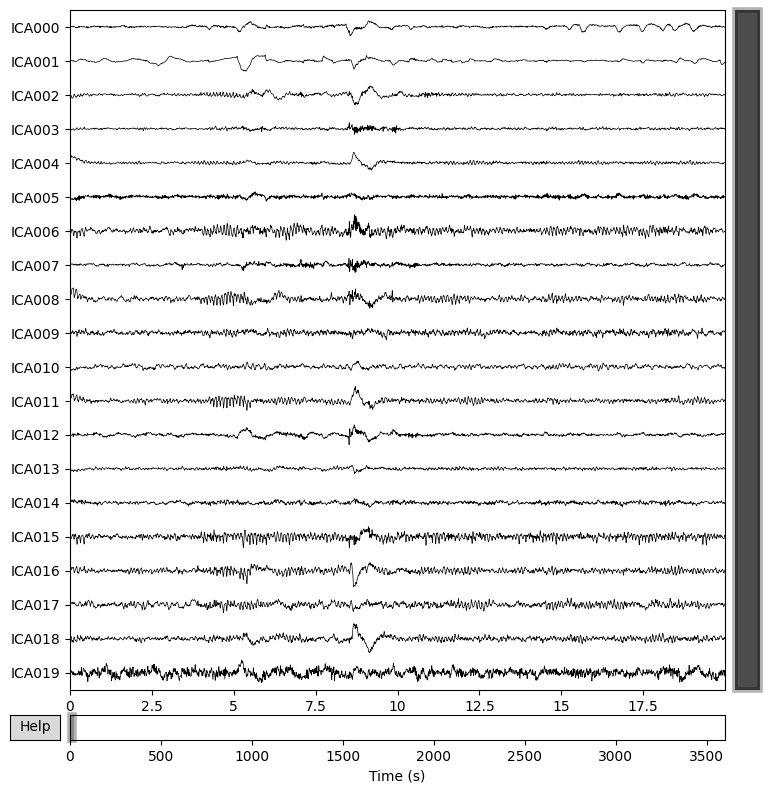

Components excluded for chb03: [0, 1]
Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 2 ICA components
    Projecting back using 23 PCA components


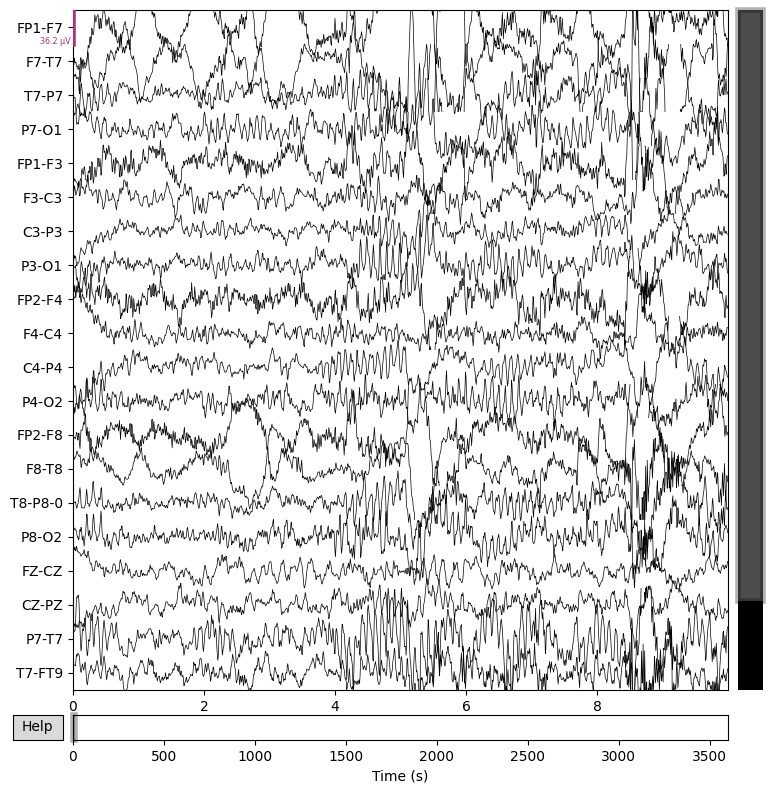

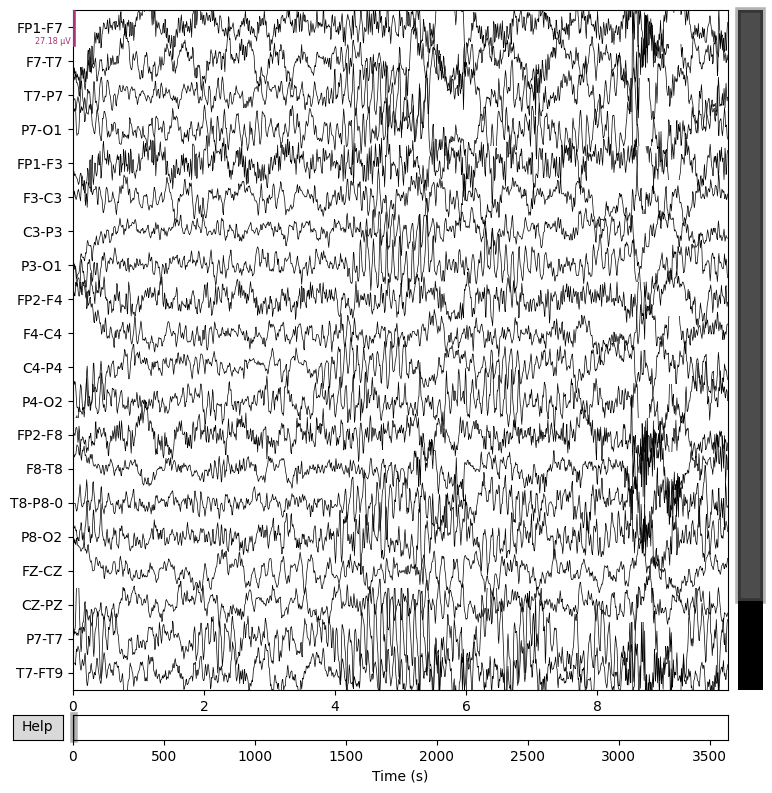

Writing /kaggle/working/clean_eeg_ica/chb03_cleaned_raw.fif
Closing /kaggle/working/clean_eeg_ica/chb03_cleaned_raw.fif
[done]
Cleaned EEG saved for chb03: /kaggle/working/clean_eeg_ica/chb03_cleaned_raw.fif


In [7]:

# 3 patients 
patients = ['chb01', 'chb02', 'chb03']  
input_dir = '/kaggle/working/cleaned_eeg'   
output_dir = '/kaggle/working/clean_eeg_ica'  
os.makedirs(output_dir, exist_ok=True)

# ====== Loop over patients ======
for patient in patients:
    print(f"\n=== Processing {patient} ===")
    
    # ======  Load filtered EEG ======
    raw_file = os.path.join(input_dir, f"{patient}_cleaned_raw.fif")
    raw_filtered = mne.io.read_raw_fif(raw_file, preload=True)
    
    # ======  Apply standard montage ======
    montage = mne.channels.make_standard_montage('standard_1020')
    raw_filtered.set_montage(montage, on_missing='ignore')

    # ======  Run ICA ======
    ica = mne.preprocessing.ICA(n_components=20, random_state=97, max_iter='auto')
    ica.fit(raw_filtered)
    
    # ======  Plot ICA sources ======
    ica.plot_sources(raw_filtered, show=True)
    
    # ======  Exclude noisy components ======
    ica.exclude = [0, 1]  
    print(f"Components excluded for {patient}: {ica.exclude}")
    
    # ====== Apply ICA cleaning ======
    raw_cleaned = ica.apply(raw_filtered.copy())
    raw_cleaned.set_meas_date(None)  # fix meas_date issue
    
    # ======  Plot before/after cleaning ======
    raw_filtered.plot(scalings='auto', title=f'{patient} - Before ICA Cleaning')
    raw_cleaned.plot(scalings='auto', title=f'{patient} - After ICA Cleaning')
    
    # ======  Save cleaned EEG ======
    save_path = os.path.join(output_dir, f"{patient}_cleaned_raw.fif")
    raw_cleaned.save(save_path, overwrite=True)
    print(f"Cleaned EEG saved for {patient}: {save_path}")


# 3.2 EEG Cleaning Quality with ICA

--- Starting EEG Cleaning Quality Analysis With ICA  ---

--- Analyzing chb01 ---
Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 513 original time points ...
0 bad epochs dropped
Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 513 original time points ...
0 bad epochs dropped
combining channels using "mean"
combining channels using "mean"


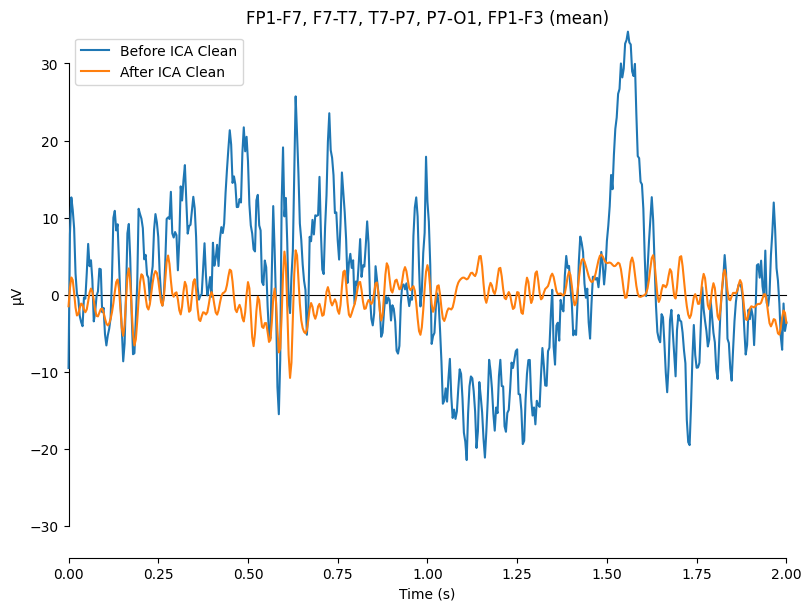

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Effective window size : 16.000 (s)
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Effective window size : 16.000 (s)


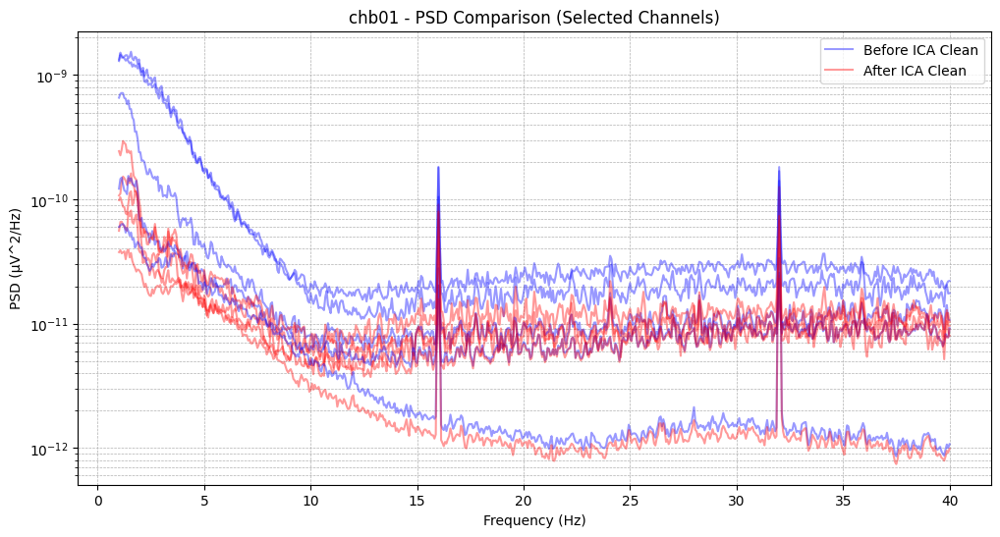


--- Analyzing chb02 ---
Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 513 original time points ...
0 bad epochs dropped
Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 513 original time points ...
0 bad epochs dropped
combining channels using "mean"
combining channels using "mean"


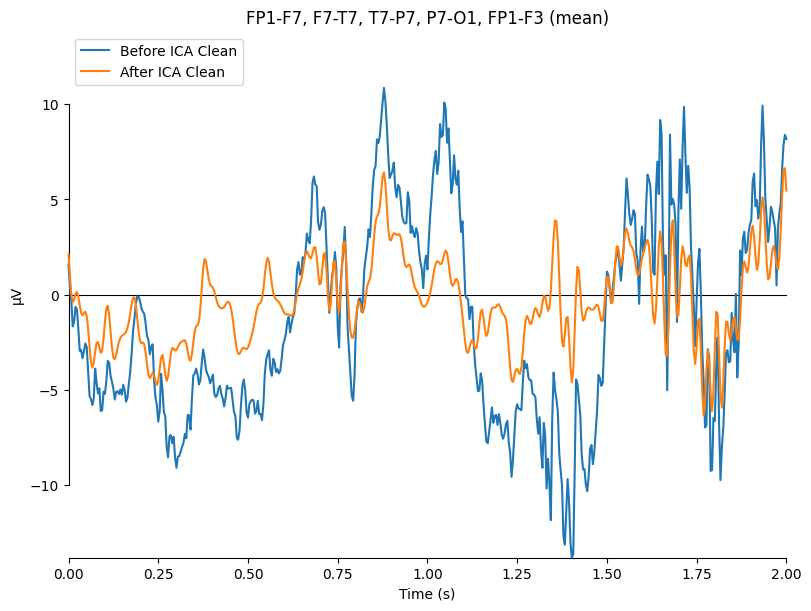

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Effective window size : 16.000 (s)
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Effective window size : 16.000 (s)


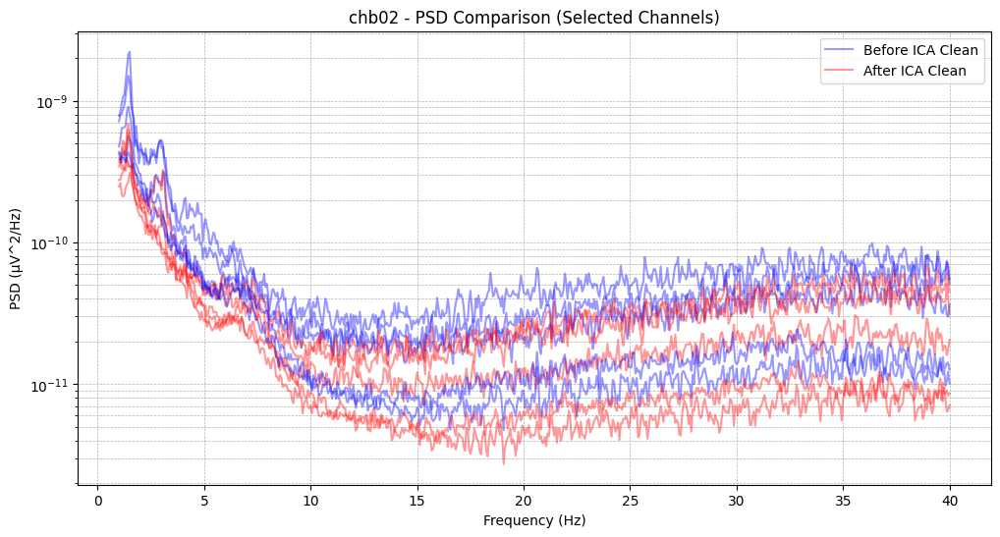


--- Analyzing chb03 ---
Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 513 original time points ...
0 bad epochs dropped
Not setting metadata
10 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 10 events and 513 original time points ...
0 bad epochs dropped
combining channels using "mean"
combining channels using "mean"


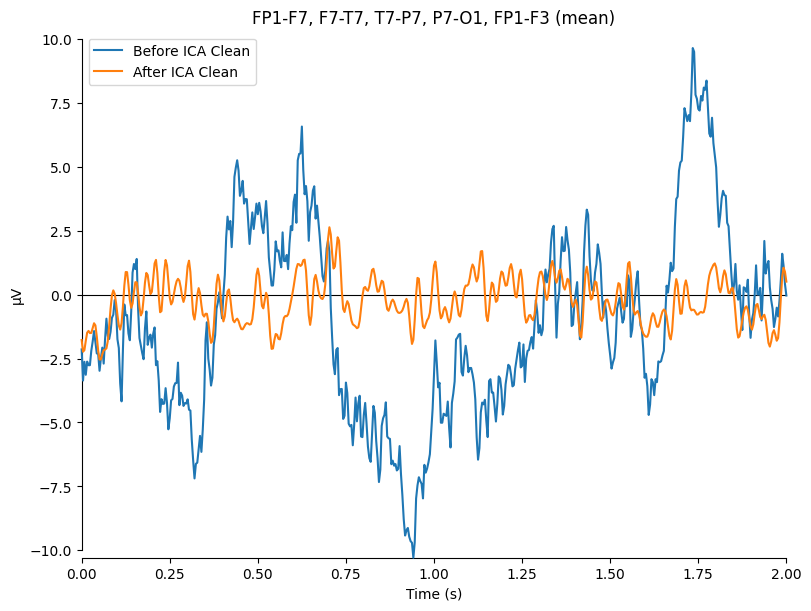

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Effective window size : 16.000 (s)
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Effective window size : 16.000 (s)


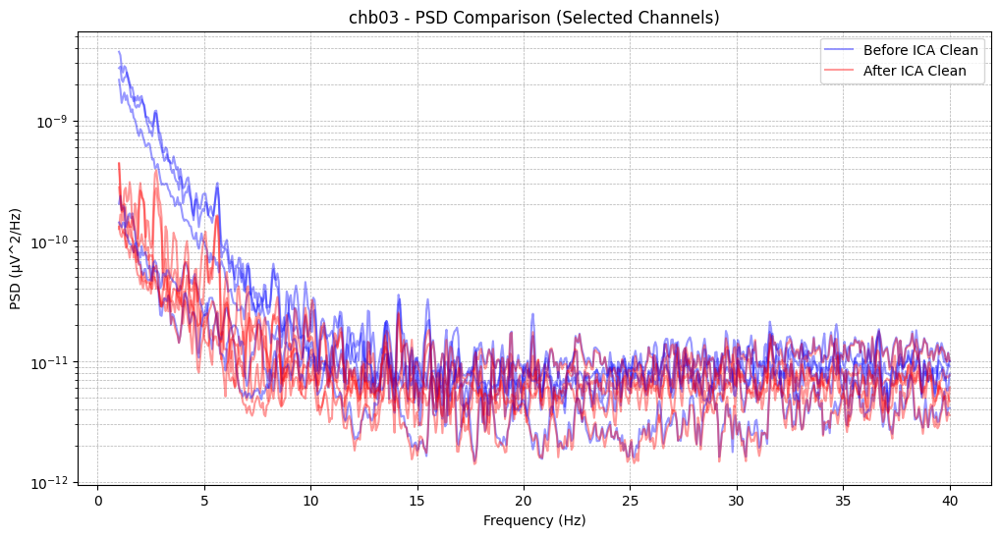

In [8]:

print("--- Starting EEG Cleaning Quality Analysis With ICA  ---")
# List of patients
patients = ['chb01', 'chb02', 'chb03']

# Paths to raw and cleaned EEG data
raw_base_path = '/kaggle/input/seizure-epilepcy-chb-mit-eeg-dataset-pediatric/chb-mit-scalp-eeg-database-1.0.0'
cleaned_path = '/kaggle/working/clean_eeg_ica'

# Active channels for visualization (can select more if needed)
active_ch = range(5)  

for patient in patients:
    print(f"\n--- Analyzing {patient} ---")
    
    # Load raw EEG
    raw_file = os.path.join(raw_base_path, patient, f"{patient}_01.edf")
    raw = mne.io.read_raw_edf(raw_file, preload=True, verbose=False)
    
    # Load cleaned EEG
    clean_file = os.path.join(cleaned_path, f"{patient}_cleaned_raw.fif")
    raw_clean = mne.io.read_raw_fif(clean_file, preload=True, verbose=False)
    
   # Create artificial events for epoching (no real triggers in dataset)
    
    n_events = 10
    events = np.array([[i * int(raw.info['sfreq'] * 3), 0, 1] for i in range(n_events)])
    
    # Epoch the signal around events (0-2 seconds)
    # This allows comparison of average response before and after cleaning

    '''
    x(t): Original signal
    T: Segment length (2 seconds in code)
    i: Segment number (era indicator)
    '''
    epochs_before = mne.Epochs(raw, events, event_id={'stim': 1},
                               tmin=0, tmax=2, baseline=None, preload=True)
    epochs_after = mne.Epochs(raw_clean, events, event_id={'stim': 1},
                              tmin=0, tmax=2, baseline=None, preload=True)
    
   
    # Compute Evoked (average of epochs)
    # Evoked waveforms are useful for checking if artifacts have been removed
    evoked_before = epochs_before.average()
    evoked_after = epochs_after.average()
    
    # Plot Evoked before vs after cleaning
    # Interpretation:
    #   - Smoother waveform after cleaning → artifacts reduced
    #   - Large spikes in "Before Clean" → likely eye blinks, muscle noise
    mne.viz.plot_compare_evokeds(
        {
            'Before ICA Clean': evoked_before,
            'After ICA Clean': evoked_after
        },
        picks=active_ch,
        combine='mean',
        show=True
    )
    
    # Compute PSD (Power Spectral Density) for selected channels
    # PSD helps visualize frequency content and line noise (50Hz)
    psd_before_obj = raw.copy().pick_channels([raw.ch_names[i] for i in active_ch]).compute_psd(fmin=1, fmax=40, n_fft=4096)
    psd_after_obj  = raw_clean.copy().pick_channels([raw_clean.ch_names[i] for i in active_ch]).compute_psd(fmin=1, fmax=40, n_fft=4096)
    
    psd_before = psd_before_obj.get_data()
    psd_after  = psd_after_obj.get_data()
    freqs = psd_before_obj.freqs
    
     # Plot PSD comparison before and after cleaning
    plt.figure(figsize=(12,6))
    for ch in range(psd_before.shape[0]):
        plt.semilogy(freqs, psd_before[ch], color='blue', alpha=0.4)
        plt.semilogy(freqs, psd_after[ch], color='red', alpha=0.4)
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('PSD (µV^2/Hz)')
    plt.title(f'{patient} - PSD Comparison (Selected Channels)')
    plt.legend(['Before ICA Clean', 'After ICA Clean'])
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.show()


# 3.3 Befor and After ICA 

* The signal cleaning process (filtering and ICA) corresponds conceptually to the Collapse Suppression mechanism proposed in the FBD model by A. Salazar.
By removing noise and restoring signal coherence, the EEG dynamics transition from a state of decoherence (entropy and disorder) to one of coherence (functional stability), mirroring the neurodynamic restoration of consciousness described in the theory.

Effective window size : 8.000 (s)
Effective window size : 8.000 (s)


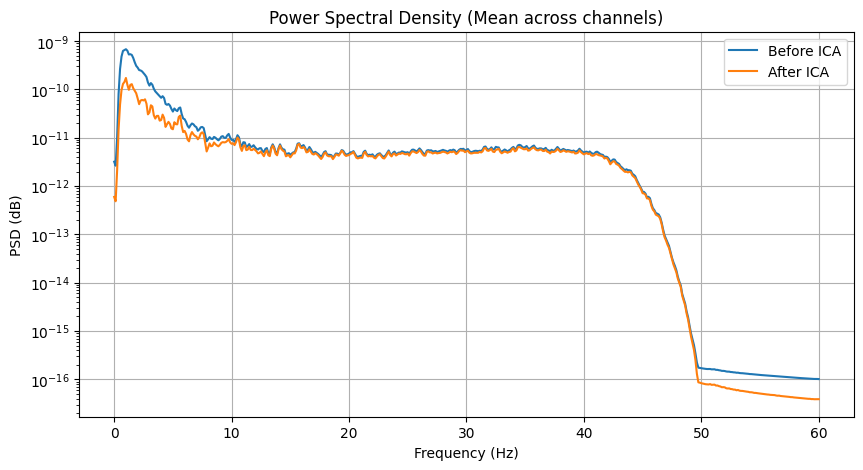

 RMS Power Before ICA: 0.0000
 RMS Power After ICA: 0.0000
 Reduction in noise power: 39.99%


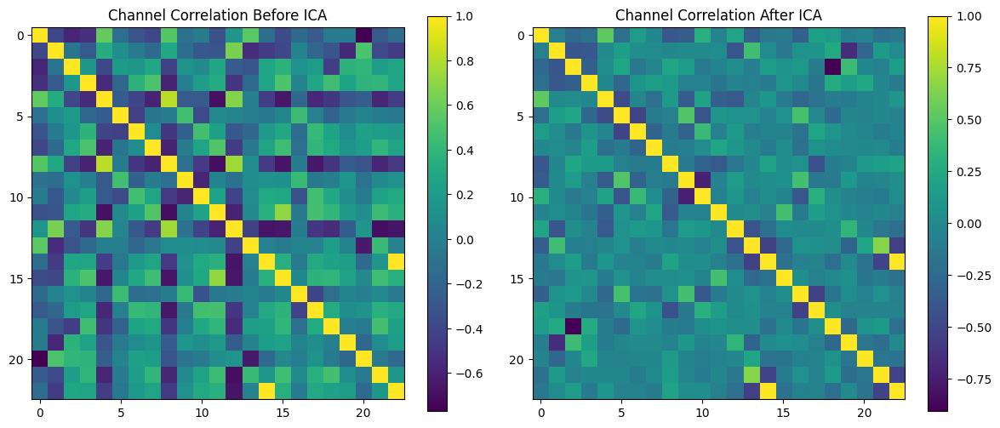

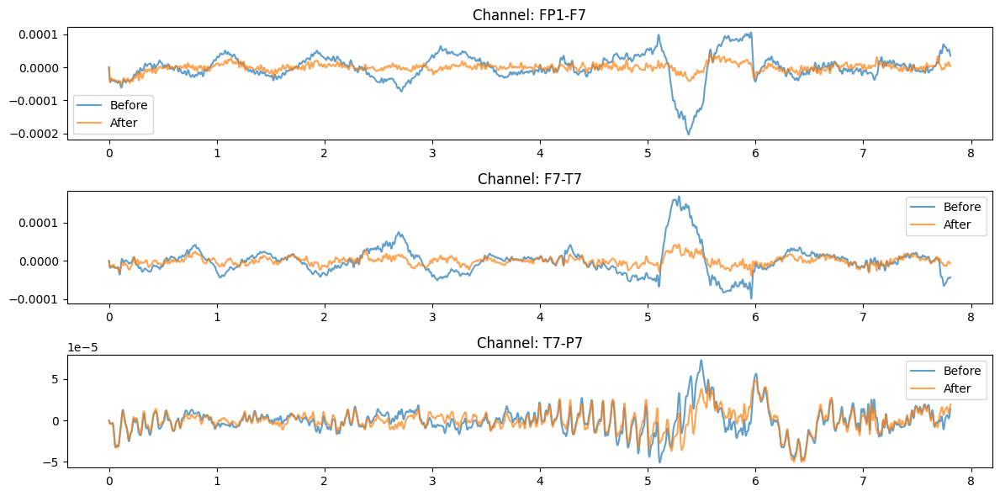

In [9]:

before = raw_filtered.copy()
after = raw_cleaned.copy()

# PSD
psd_before = before.compute_psd(fmax=60)
psd_after = after.compute_psd(fmax=60)

# Data extraction
freqs_before = psd_before.freqs
freqs_after = psd_after.freqs
psd_data_before, _ = psd_before.get_data(return_freqs=True)
psd_data_after, _ = psd_after.get_data(return_freqs=True)

# Comparison chart
plt.figure(figsize=(10, 5))
plt.semilogy(freqs_before, psd_data_before.mean(axis=0), label='Before ICA')
plt.semilogy(freqs_after, psd_data_after.mean(axis=0), label='After ICA')
plt.title('Power Spectral Density (Mean across channels)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('PSD (dB)')
plt.legend()
plt.grid(True)
plt.show()

# RMS Power
before_data = before.get_data()
after_data = after.get_data()

before_power = np.sqrt(np.mean(before_data**2))
after_power = np.sqrt(np.mean(after_data**2))

print(f" RMS Power Before ICA: {before_power:.4f}")
print(f" RMS Power After ICA: {after_power:.4f}")
print(f" Reduction in noise power: {(1 - after_power/before_power)*100:.2f}%")

# Correlation matrix
corr_before = np.corrcoef(before_data)
corr_after = np.corrcoef(after_data)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
im1 = axes[0].imshow(corr_before, cmap='viridis')
axes[0].set_title('Channel Correlation Before ICA')
plt.colorbar(im1, ax=axes[0])

im2 = axes[1].imshow(corr_after, cmap='viridis')
axes[1].set_title('Channel Correlation After ICA')
plt.colorbar(im2, ax=axes[1])
plt.tight_layout()
plt.show()

# Displaying signals for the first channels
channels = before.ch_names[:3]
fig, axes = plt.subplots(len(channels), 1, figsize=(12, 6))
for i, ch in enumerate(channels):
    idx = before.ch_names.index(ch)
    axes[i].plot(before.times[:2000], before_data[idx, :2000], label='Before', alpha=0.7)
    axes[i].plot(after.times[:2000], after_data[idx, :2000], label='After', alpha=0.7)
    axes[i].set_title(f'Channel: {ch}')
    axes[i].legend()
plt.tight_layout()
plt.show()


> --------------

# 4.1 Neurotopological Analysis

* Mathmatical Foundation Used in EEG Nerotopological Analysis
1. Permutation Entropy
 * Formula:      H = -∑ p_i * log(p_i)
 * Description:  Measures the signal complexity (irregularity).
 * Usage:        Applied per EEG channel using ant.perm_entropy().
 * Importance:   High entropy → high neural complexity and cortical activity diversity.

2. Pearson Correlation Coefficient
 * Formula:      r = Cov(X, Y) / (σ_X * σ_Y)
 * Description:  Measures the linear dependency between EEG channels.
 * Usage:        Used to build the Functional Correlation Matrix.
 * Importance:   Reveals neural synchronization and inter-channel coherence.

3. Distance Matrix
 * Formula:      D = 1 - |r|
 * Description:  Converts correlation values into geometric distances.
 * Usage:        Input for topological data analysis (TDA).
 * Importance:   Represents brain network geometry and dissimilarity between channels.

4. Ricci Curvature
 * Formula:      K(u,v) = 1 - W(u,v)
 * Description:  Computes local geometric stability between connected nodes.
 * Usage:        Calculated using Wasserstein distance between node distributions.
 * Importance:   Higher curvature → stronger and more stable brain network connections.


=== Detailed Neurotopological Analysis for Cleaned EEG ===
Metrics computed. Generating panel...


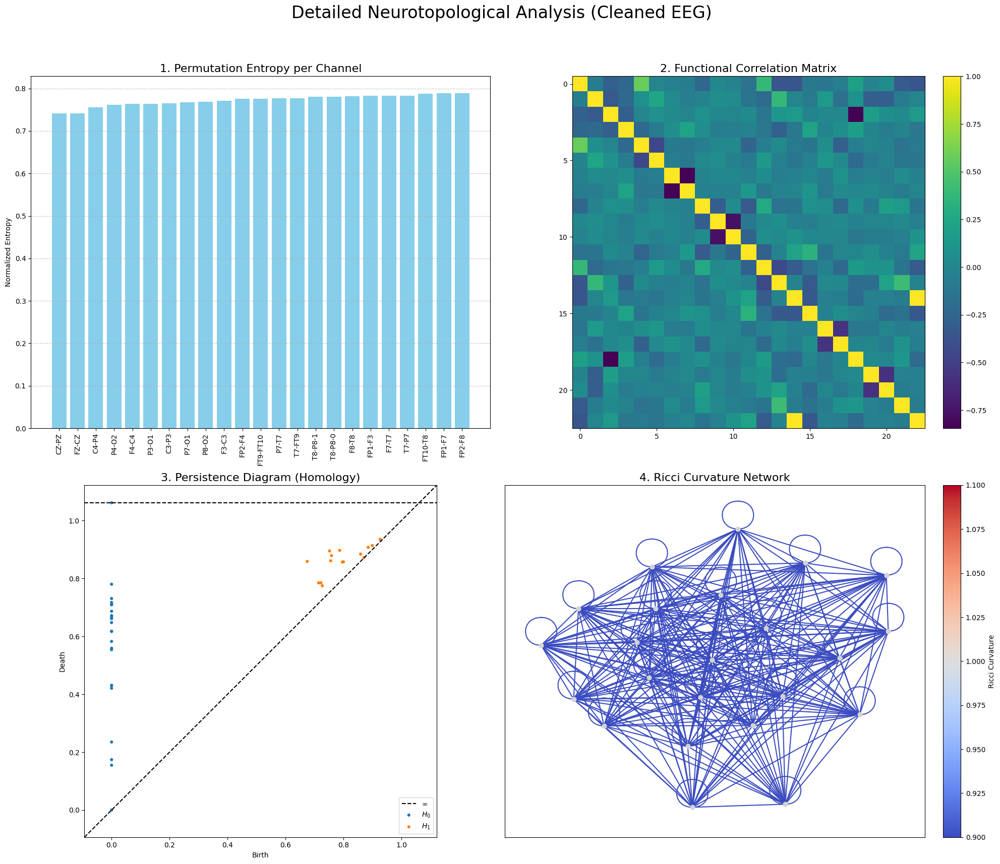


 Analysis complete. Image saved as detailed_cleaned_eeg_analysis.png


In [10]:


print("=== Detailed Neurotopological Analysis for Cleaned EEG ===")

# --- Prepare filtered cleaned data ---
raw_cleaned_filtered = raw_cleaned.copy().filter(l_freq=1.0, h_freq=40.0, verbose=False)

# A. Permutation Entropy
eeg_data = raw_cleaned_filtered.get_data(units='V')
channel_names = raw_cleaned.ch_names
entropies = [ant.perm_entropy(ch, normalize=True) for ch in eeg_data]

# B. Correlation matrix, homology, Ricci curvature
segment = raw_cleaned_filtered.copy().crop(tmin=60, tmax=120).get_data(units='V')
corr_matrix = np.nan_to_num(np.corrcoef(segment.T, rowvar=False))
dist_matrix = 1 - np.abs(corr_matrix)
homology_diagrams = ripser.ripser(dist_matrix, maxdim=1, distance_matrix=True)['dgms']

def compute_ricci_curvature(G):
    for u, v in G.edges():
        d_u, d_v = G.degree(u), G.degree(v)
        if d_u < 2 or d_v < 2: continue
        p_u, p_v = np.ones(d_u)/d_u, np.ones(d_v)/d_v
        dist = wasserstein_distance(np.arange(d_u), np.arange(d_v), p_u, p_v)
        G[u][v]['ricciCurvature'] = 1 - dist
    return G

G = nx.from_numpy_array(np.abs(corr_matrix))
G_curvature = compute_ricci_curvature(G.copy())
curvatures = [d.get('ricciCurvature', 0.0) for u, v, d in G_curvature.edges(data=True)]

print("Metrics computed. Generating panel...")

# --- Visualization Panel ---
fig, axs = plt.subplots(2, 2, figsize=(20, 18))
fig.suptitle('Detailed Neurotopological Analysis (Cleaned EEG)', fontsize=24)

# Permutation Entropy Bar Plot
sorted_idx = np.argsort(entropies)
axs[0, 0].bar(np.array(channel_names)[sorted_idx], np.array(entropies)[sorted_idx], color='skyblue')
axs[0, 0].set_title('1. Permutation Entropy per Channel', fontsize=16)
axs[0, 0].set_ylabel('Normalized Entropy')
axs[0, 0].tick_params(axis='x', rotation=90)
axs[0, 0].grid(axis='y', linestyle='--', alpha=0.7)

#  Functional Correlation Matrix
im = axs[0, 1].imshow(corr_matrix, cmap='viridis', interpolation='nearest')
axs[0, 1].set_title('2. Functional Correlation Matrix', fontsize=16)
fig.colorbar(im, ax=axs[0, 1], fraction=0.046, pad=0.04)

#  Persistence Diagram (Homology)
persim.plot_diagrams(homology_diagrams, ax=axs[1, 0], show=False)
axs[1, 0].set_title('3. Persistence Diagram (Homology)', fontsize=16)

#  Ricci Curvature Network
pos = nx.spring_layout(G_curvature, seed=42)
edges = nx.draw_networkx_edges(G_curvature, pos, ax=axs[1, 1], edge_color=curvatures, edge_cmap=plt.cm.coolwarm, width=1.5)
nx.draw_networkx_nodes(G_curvature, pos, ax=axs[1, 1], node_color='lightgray', node_size=40)
cbar = fig.colorbar(edges, ax=axs[1, 1], fraction=0.046, pad=0.04)
cbar.set_label('Ricci Curvature')
axs[1, 1].set_title('4. Ricci Curvature Network', fontsize=16)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig("detailed_cleaned_eeg_analysis.png")
plt.show()

print("\n Analysis complete. Image saved as detailed_cleaned_eeg_analysis.png")


# 4.2 video visualizes
> how brain complexity evolves before, during, and after an epileptic seizure

In [11]:
# ====== Load EEG ======
RAW_FILE = '/kaggle/working/cleaned_eeg/chb01_cleaned_raw.fif'
raw = mne.io.read_raw_fif(RAW_FILE, preload=True)
raw.pick_types(eeg=True)
raw.filter(0.1, 80.0, verbose=False)

# ====== Channels ======
channels = raw.ch_names  

# ====== Seizure segments ======
segments = {
    'Before Seizure': (1000, 1060),
    'During Seizure': (2996, 3036),
    'After Seizure': (3100, 3160)
}

# ====== Color maps for bar plots ======
stage_colors = {
    'Before Seizure': 'red',
    'During Seizure': 'blue',
    'After Seizure': 'green'
}

# ====== Video settings ======
VIDEO_NAME = 'entropy_fd_bar_video.mp4'
FPS = 5
window_sec = 5.0
step_sec = 1.0

with imageio.get_writer(VIDEO_NAME, fps=FPS) as writer:
    for stage, (t_start, t_end) in segments.items():
        color = stage_colors[stage]
        times = np.arange(t_start, t_end, step_sec)

        for t0 in times:
            t1 = t0 + window_sec
            data = raw.copy().crop(tmin=t0, tmax=t1).get_data(units='uV')
            if data.shape[1] == 0:
                continue

            #  Entropy and Fractal Dimension for each channel
            entropy_vals = [ant.perm_entropy(ch, normalize=True) for ch in data]
            fractal_vals = [ant.higuchi_fd(ch) for ch in data]

            fig, axs = plt.subplots(1, 2, figsize=(12,5))

            # X = channel names
            axs[0].bar(channels, entropy_vals, color=color)
            axs[0].set_xticklabels(channels, rotation=45, ha='right')
            axs[0].set_ylim(0, 1)
            axs[0].set_title('Entropy')

            axs[1].bar(channels, fractal_vals, color=color)
            axs[1].set_xticklabels(channels, rotation=45, ha='right')
            axs[1].set_ylim(0.8, 2.0)
            axs[1].set_title('Fractal Dimension')

            plt.suptitle(f'{stage} | {t0:.1f}-{t1:.1f}s', fontsize=16)
            plt.tight_layout()

            # fig to array and and it to ved 
            fig.canvas.draw()
            img = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
            img = img.reshape(fig.canvas.get_width_height()[::-1] + (3,))
            writer.append_data(img)
            plt.close(fig)

print(f"\n Video created successfully: {VIDEO_NAME}")


Opening raw data file /kaggle/working/cleaned_eeg/chb01_cleaned_raw.fif...
Isotrak not found
    Range : 0 ... 921599 =      0.000 ...  3599.996 secs
Ready.
Reading 0 ... 921599  =      0.000 ...  3599.996 secs...
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


/tmp/ipykernel_19/636275056.py:49: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0].set_xticklabels(channels, rotation=45, ha='right')
/tmp/ipykernel_19/636275056.py:54: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1].set_xticklabels(channels, rotation=45, ha='right')



 Video created successfully: entropy_fd_bar_video.mp4


> -----------------------------

| FBD Phase                     | Corresponding Segment in the Video                   | Physiological Interpretation                                                                 |
|--------------------------------|------------------------------------------------------|---------------------------------------------------------------------------------------------|
| Isostasis (Bio-dynamic Balance) | “Before Seizure” – diverse and moving colors       | The brain is in a flexible dynamic equilibrium with high complexity and rich network connectivity. |
| Collapse (Complexity Breakdown) | “During Seizure” – colors become unified and shift to blue/purple | Network coherence collapses, activity becomes locked, H and D drop → loss of conscious flexibility. |
| Metastasis / Recovery           | “After Seizure” – colors begin to diversify again  | Neural structure reorganizes and network energy returns toward a cognitively organized state. |


| Panel | What It Represents | Color Dynamics | Neurophysiological Meaning |
|----------------------------------------|--------------------------------------------------------------|---------------------------------------------------------------------------------------------------------------------------------|--------------------------------------------------------------------------|
| Left Panel – Permutation Entropy (H) | Measures temporal complexity of EEG signals, i.e., the degree of organized variability in neural activity. | At the beginning (pre-seizure), colors are yellow/red → high complexity. During seizure, they shift to blue/purple → sudden loss of complexity. After seizure, warm tones reappear. | Shows the transition from flexible dynamic consciousness → organizational collapse (seizure) → re-equilibration. |
| Right Panel – Fractal Dimension (D) | Describes the spatial structure of the neural network, i.e., how deeply interconnected the cortical regions are. | In normal states, values are high and diverse (light colors). During seizure, they drop and become uniform (cool tones). After seizure, gradual increase and diversification appear again. | The reduction indicates the network lost its multiscale architecture — the Collapse of Complexity predicted by FBD. |


> -------------------------

In [12]:
from IPython.display import Video, display
VIDEO_PATH = '/kaggle/working/entropy_fd_bar_video.mp4'
display(Video(VIDEO_PATH, embed=True, width=640, height=480))

> ------------------------------

* The practical application to patient data will be in the second part.
  
* [Part-Two-Practical ](http://www.kaggle.com/code/engdhay/fbd-part-two)

> ------------------